In [1]:
rm(list = ls())
set.seed(1234)
options(future.seed = TRUE)
Sys.setenv(RETICULATE_PYTHON = "/home/gonglihao/miniconda3/envs/42/bin/python")
suppressPackageStartupMessages({
    library("dplyr")
    library("Matrix")
    library("Seurat")
    library("future.apply")
    library("tictoc")
    library("ggplot2")
    library("ggpubr")
    library("future")
    library("COSG")
    library("harmony")
    library("parallel")
    library("patchwork")
})

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
combined <- readRDS("/data3/Group8/gonglihao/1-p38/3-Annotation/anno-0.9.rds")

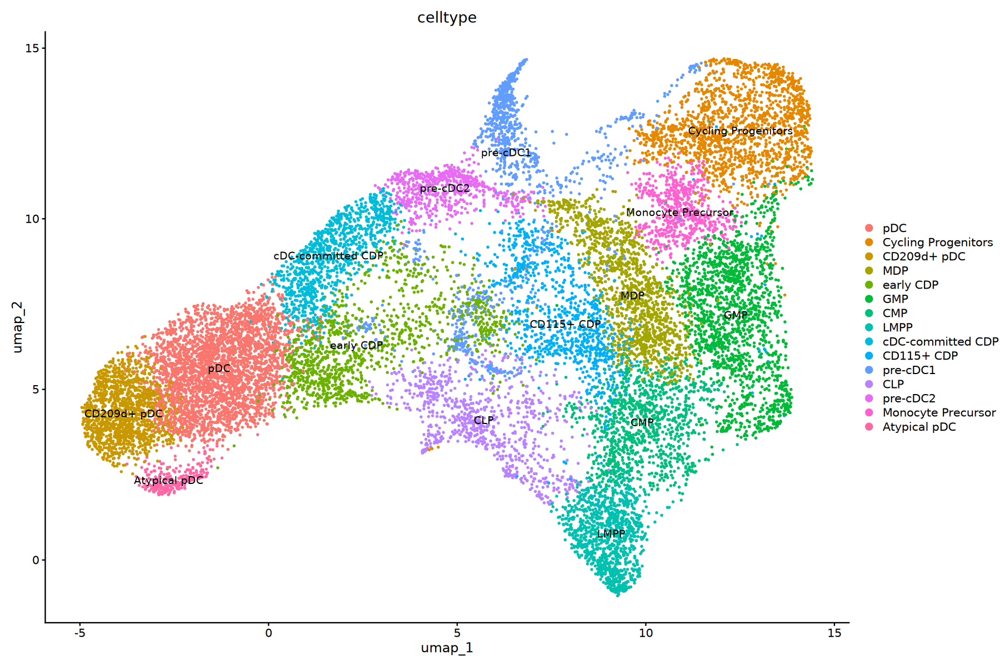

In [2]:
options(repr.plot.width = 15, repr.plot.height = 10)
DimPlot(combined,
        reduction = "umap",
        group.by = "celltype",
        label = TRUE,
        label.size = 4,
        pt.size = 0.5)

cluster_mapping <- c(
  "0" = "pDC",
  "1" = "Cycling Progenitors",
  "2" = "CD209d+ pDC",
  "3" = "MDP",
  "4" = "early CDP",
  "5" = "GMP",
  "6" = "CMP",
  "7" = "LMPP",
  "8" = "cDC-committed CDP",
  "9" = "CD115+ CDP",
  "10" = "pre-cDC1",
  "11" = "CLP",
  "12" = "pre-cDC2",
  "13" = "Monocyte Precursor",
  "14" = "GMP",
  "15" = "Atypical pDC",
  "16" = "pre-cDC1"
)

In [3]:
target_celltypes <- c("early CDP", "cDC-committed CDP", "CD115+ CDP")
seu <- subset(combined, celltype %in% target_celltypes)
tic()
# 标准化
seu <- NormalizeData(seu,
                    normalization.method = "LogNormalize",
                    scale.factor = 10000,
                    block.size = 800)

# 寻找高变基因
seu <- FindVariableFeatures(seu,
                          selection.method = "vst",
                          nfeatures = 2000)

# 数据标准化
plan("sequential")  # 临时切换到串行模式
seu <- ScaleData(seu,
                features = rownames(seu),
                block.size = 1000,
                min.cells.to.block = 1000)
plan("multicore", workers = 54)  # 恢复并行模式
toc()

tic()
# 运行PCA
seu <- RunPCA(seu, npcs = 30, verbose = FALSE)

# 运行Harmony
seu <- RunHarmony(seu,
                 group.by.vars = "orig.ident",
                 seed.use = 1234)

# 运行UMAP
seu <- RunUMAP(seu,
              reduction = "harmony",
              dims = 1:30,
              umap.method = "umap-learn",
              metric = "correlation",
              verbose = FALSE)
toc()

seu <- FindNeighbors(object = seu,
                    dims = 1:30,
                    verbose = FALSE, 
                    reduction = "harmony")

# 不同分辨率的聚类和可视化
resolution.range <- seq(0.1, 1.2, by = 0.1)
plot_list <- list()

for (res in resolution.range) {
    # 进行聚类
    seu <- FindClusters(seu,
        resolution = res,
        verbose = FALSE,
        random.seed = 1234)
    
    cluster_column <- paste0("RNA_snn_res.", res)
    
    p <- DimPlot(seu,
        reduction = "umap",
        group.by = cluster_column,
        label = TRUE,
        label.size = 4) +
        ggtitle(paste("Resolution:", res))
    
    plot_list[[length(plot_list) + 1]] <- p
}

Normalizing layer: counts.WT

Normalizing layer: counts.KO

Finding variable features for layer counts.WT

Finding variable features for layer counts.KO

Centering and scaling data matrix



10.869 sec elapsed


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



66.107 sec elapsed


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”
Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "igno

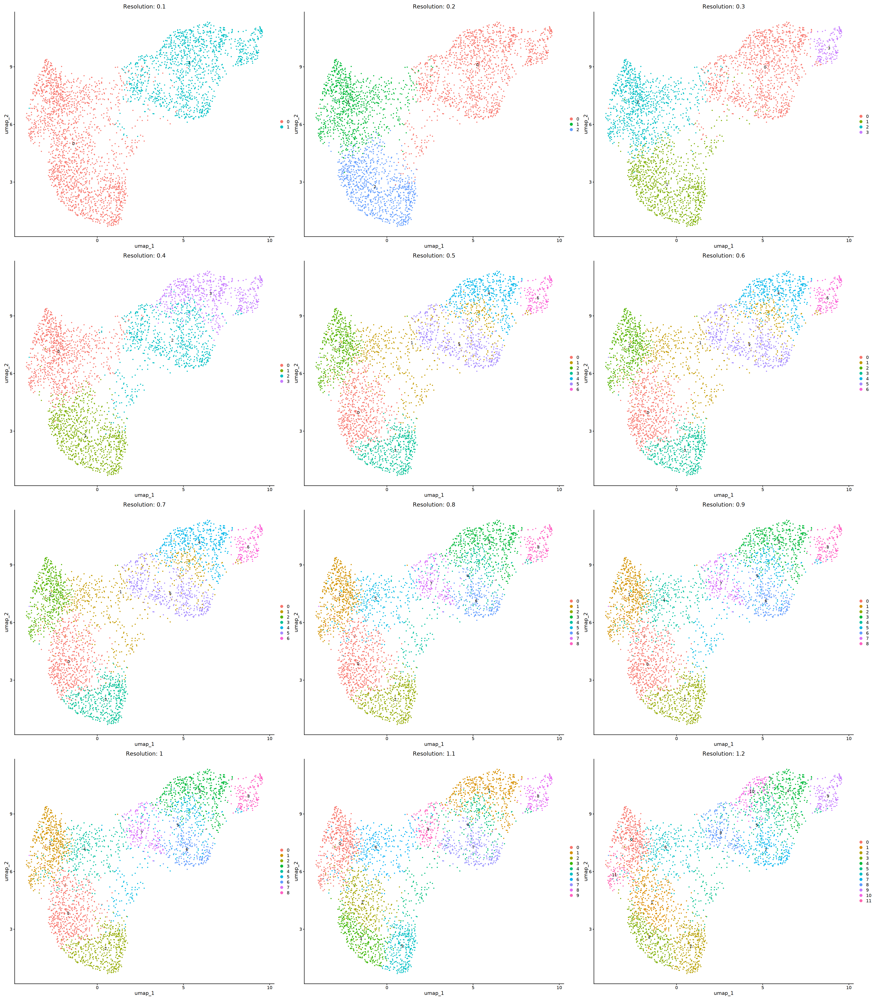

In [4]:
options(repr.plot.width = 35, repr.plot.height = 40)
wrap_plots(plot_list, ncol = 3)

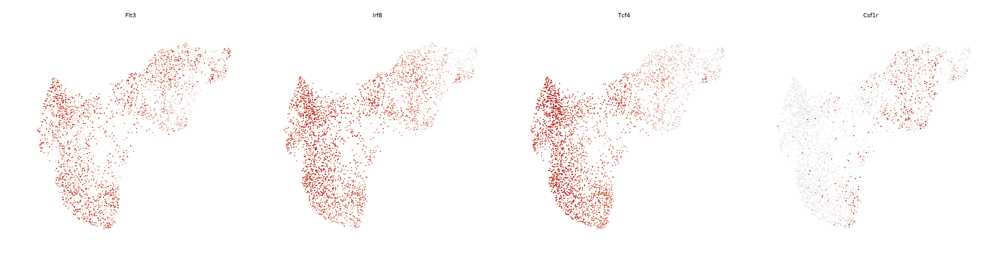

In [6]:
# 设置图形大小
options(repr.plot.width = 30, repr.plot.height = 8)

# 创建FeaturePlot
FeaturePlot(seu,
    features = c( "Flt3", "Irf8", "Tcf4","Csf1r"),
    ncol = 4,
    pt.size = 0.1,
    order = TRUE,
    reduction = "umap",
    cols = c("grey90", "#B30000"),
    min.cutoff = "q10",
    max.cutoff = "q90"
) &
theme_minimal() &
theme(
    plot.title = element_text(size = 12, face = "bold", hjust = 0.5),  # 标题居中
    strip.text = element_text(size = 12, face = "bold", hjust = 0.5),  # 分面标题居中
    axis.title = element_blank(),    # 移除轴标题
    axis.text = element_blank(),     # 移除轴文本
    axis.ticks = element_blank(),    # 移除轴刻度线
    legend.position = "none",        # 移除图例
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    plot.margin = margin(0.5, 0.5, 0.5, 0.5, "cm")
)

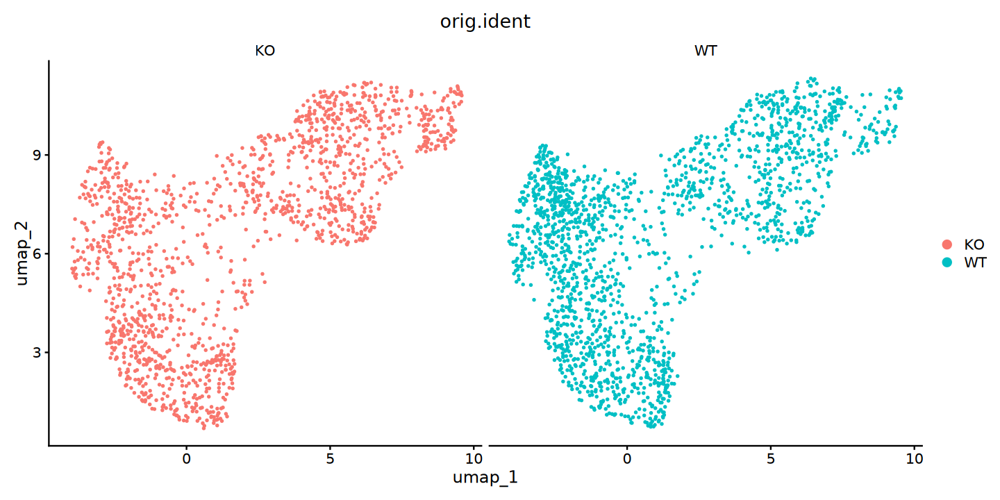

In [7]:
options(repr.plot.width = 12, repr.plot.height = 6)
DimPlot(seu, reduction = "umap", group.by = "orig.ident", split.by = "orig.ident")

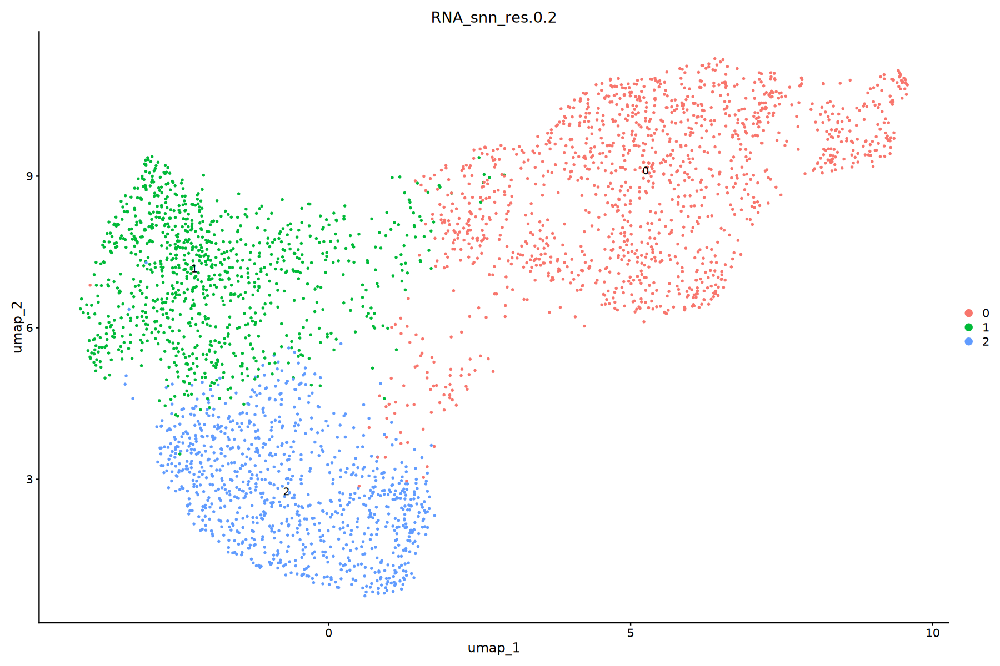

In [11]:
options(repr.plot.width = 15, repr.plot.height = 10)
DimPlot(seu,
        reduction = "umap",
        group.by = "RNA_snn_res.0.2",
        label = TRUE,
        label.size = 4,
        pt.size = 0.5)

In [12]:
library(COSG)
library(writexl)

output_path <- "/data3/Group8/gonglihao/1-p38/4-subCDP"
cluster_col <- "RNA_snn_res.0.2"
seu <- JoinLayers(seu)
Idents(seu) <- cluster_col

cosg_markers <- cosg(
   seu,
   groups = 'all',
   mu = 1
)

avg_expr <- AggregateExpression(
   seu,
   group.by = cluster_col,
   assays = "RNA"
)$RNA

cluster_vec <- rep(names(cosg_markers$names), sapply(cosg_markers$names, length))
genes_vec <- unlist(cosg_markers$names)
scores_vec <- unlist(cosg_markers$scores)

cosg_results_df <- data.frame(
   cluster = cluster_vec,
   Gene = genes_vec,
   Score = scores_vec,
   stringsAsFactors = FALSE
)

cluster_names <- paste0("g", cosg_results_df$cluster)
cosg_results_df$Avg_Expression <- NA

genes_match <- match(cosg_results_df$Gene, rownames(avg_expr))
clusters_match <- match(cluster_names, colnames(avg_expr))
valid_indices <- !is.na(genes_match) & !is.na(clusters_match)
cosg_results_df$Avg_Expression[valid_indices] <- round(
   avg_expr[cbind(
       genes_match[valid_indices], 
       clusters_match[valid_indices]
   )],
   3
)

cosg_results_df$cluster <- as.numeric(cosg_results_df$cluster)
cosg_results_df <- cosg_results_df[order(cosg_results_df$cluster, -cosg_results_df$Score),]

excel_data <- split(cosg_results_df, cosg_results_df$cluster)
excel_data <- lapply(excel_data, function(x) {
   x <- x[order(-x$Score),]
   x$cluster <- NULL
   return(x)
})
names(excel_data) <- paste0("Cluster", names(excel_data))

resolution <- sub(".*res\\.", "", cluster_col)

excel_filename <- paste0("cosg-", resolution, ".xlsx")
csv_filename <- paste0("cosg-", resolution, ".csv")

write_xlsx(excel_data, path = file.path(output_path, excel_filename))
data.table::fwrite(cosg_results_df, file = file.path(output_path, csv_filename))

Warning message:
“x or y has vectors with all zero; consider setting use_nan = TRUE to set these values to NaN or use_nan = FALSE to suppress this warning”


In [21]:
cluster_mapping <- c(
  "0" = "CD115+ CDP",
  "1" = "CD115- CDP"
)
# 2. 设置聚类顺序和celltype
Idents(seu) <- seu$RNA_snn_res.0.1  
seu$celltype <- plyr::mapvalues(
  Idents(seu),
  from = names(cluster_mapping),
  to = unname(cluster_mapping)
)

基因 Sfpi1 未在数据集中找到。


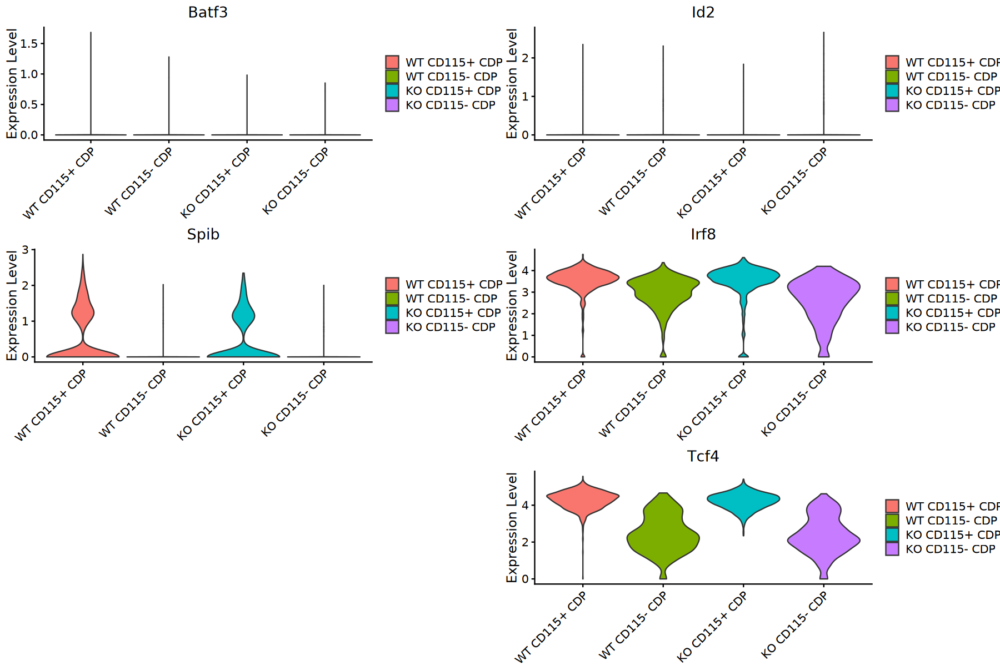

In [22]:
# 创建一个新的分组变量，将orig.ident(WT/KO)和celltype(CD115+/CD115-)组合
seu$group <- paste(seu$orig.ident, seu$celltype, sep = " ")

# 设置小提琴图的显示顺序
group_levels <- c("WT CD115+ CDP", "WT CD115- CDP", "KO CD115+ CDP", "KO CD115- CDP")
seu$group <- factor(seu$group, levels = group_levels)

# 小鼠基因名称对应
# Batf3 (保持不变)
# Id2 (保持不变)
# SpiB -> Spib
# Irf8 (保持不变)
# Sfpi1 (保持不变)
# E2-2 -> Tcf4

# 创建小提琴图
library(ggplot2)
library(cowplot)

# 需要比较的基因列表(使用正确的小鼠基因符号)
genes_to_plot <- c("Batf3", "Id2", "Spib", "Irf8", "Sfpi1", "Tcf4")

# 创建一个空列表存储每个基因的小提琴图
plot_list <- list()

# 为每个基因创建小提琴图
for (i in seq_along(genes_to_plot)) {
  gene <- genes_to_plot[i]
  
  # 检查基因是否在数据集中
  if (gene %in% rownames(seu)) {
    p <- VlnPlot(seu, features = gene, group.by = "group", 
                 pt.size = 0, combine = FALSE)[[1]] +
      theme(axis.title.x = element_blank(),
            axis.text.x = element_text(angle = 45, hjust = 1),
            plot.title = element_text(hjust = 0.5)) +
      xlab("")
    
    plot_list[[i]] <- p
  } else {
    cat(paste0("基因 ", gene, " 未在数据集中找到。\n"))
  }
}

# 组合所有小提琴图并显示
combined_plot <- plot_grid(plotlist = plot_list, ncol = 2)
print(combined_plot)

# 如果需要单独查看每个基因的表达分布，也可以逐个显示
# 例如：
# VlnPlot(seu, features = "Batf3", group.by = "group", pt.size = 0) +
#   theme(axis.text.x = element_text(angle = 45, hjust = 1))

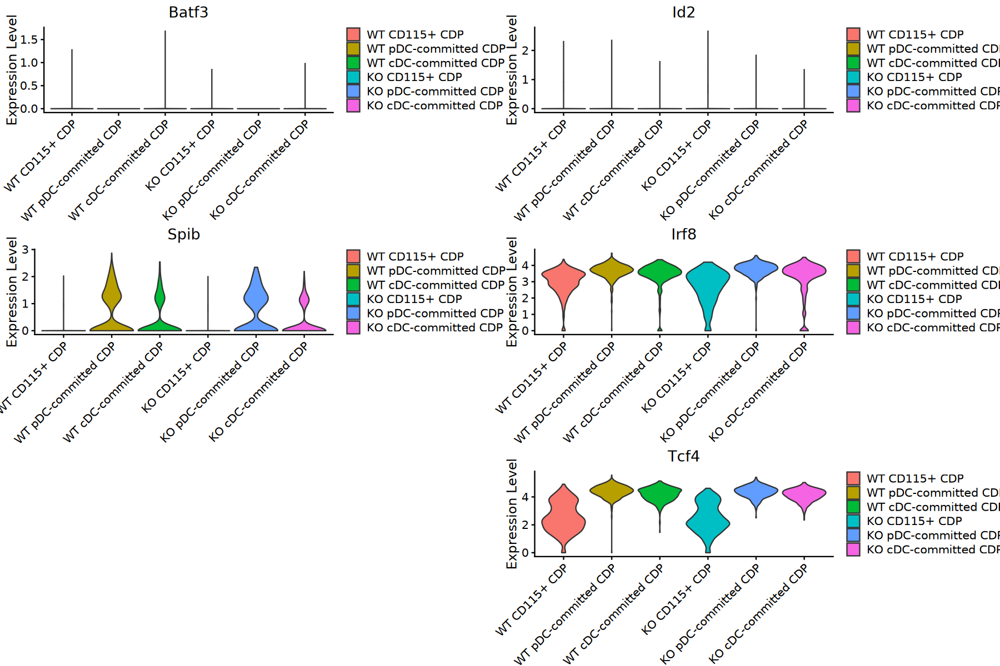

In [17]:
cluster_mapping <- c(
   "0" = "CD115+ CDP",
   "1" = "pDC-committed CDP",
   "2" = "cDC-committed CDP"
)

# 2. 设置聚类顺序和celltype
Idents(seu) <- seu$RNA_snn_res.0.2
seu$celltype <- plyr::mapvalues(
   Idents(seu),
   from = names(cluster_mapping),
   to = unname(cluster_mapping)
)

# 创建详细分组变量
seu$detailed_group <- paste(seu$orig.ident, seu$celltype, sep = " ")

# 设置详细小提琴图的显示顺序
detailed_group_levels <- c(
   "WT CD115+ CDP", 
   "WT pDC-committed CDP", 
   "WT cDC-committed CDP",
   "KO CD115+ CDP", 
   "KO pDC-committed CDP", 
   "KO cDC-committed CDP"
)
seu$detailed_group <- factor(seu$detailed_group, levels = detailed_group_levels)

# 为每个基因创建详细小提琴图
detailed_plot_list <- list()

for (i in seq_along(genes_to_plot)) {
   gene <- genes_to_plot[i]
   
   if (gene %in% rownames(seu)) {
     p <- VlnPlot(seu, features = gene, group.by = "detailed_group",
                  pt.size = 0, combine = FALSE)[[1]] +
       theme(axis.title.x = element_blank(),
             axis.text.x = element_text(angle = 45, hjust = 1),
             plot.title = element_text(hjust = 0.5)) +
       xlab("")
     
     detailed_plot_list[[i]] <- p
   }
}

# 组合所有详细小提琴图并显示
detailed_combined_plot <- plot_grid(plotlist = detailed_plot_list, ncol = 2)
print(detailed_combined_plot)

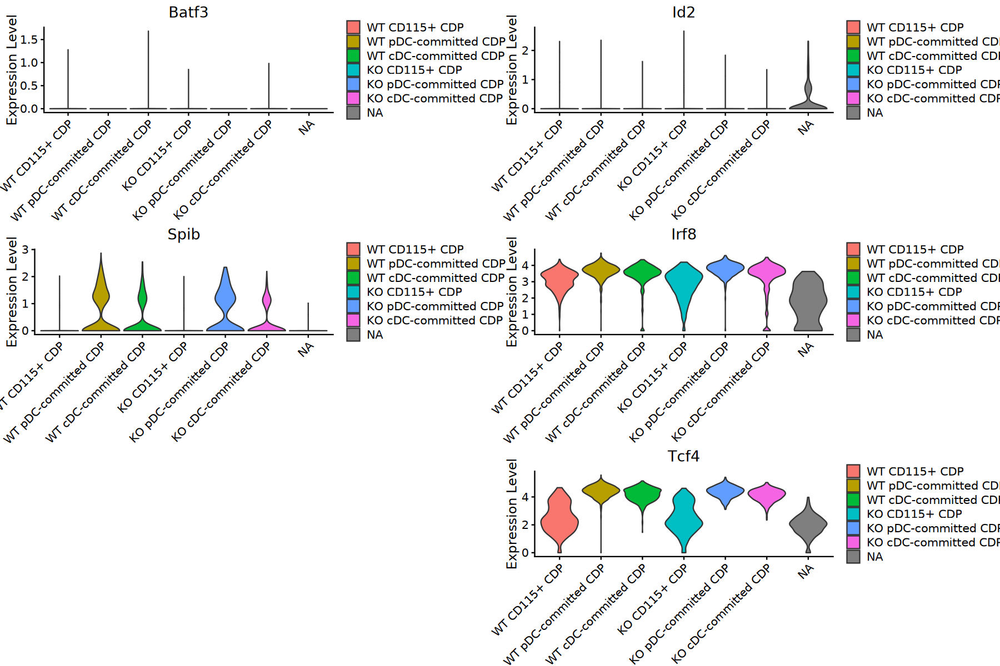

In [23]:
cluster_mapping <- c(
   "0" = "CD115+ CDP",
   "1" = "cDC-committed CDP",
   "2" = "pDC-committed CDP",
   "3" = "p-CDP"
)

# 2. 设置聚类顺序和celltype
Idents(seu) <- seu$RNA_snn_res.0.3
seu$celltype <- plyr::mapvalues(
   Idents(seu),
   from = names(cluster_mapping),
   to = unname(cluster_mapping)
)

# 创建详细分组变量
seu$detailed_group <- paste(seu$orig.ident, seu$celltype, sep = " ")

# 设置详细小提琴图的显示顺序
detailed_group_levels <- c(
   "WT CD115+ CDP", 
   "WT pDC-committed CDP", 
   "WT cDC-committed CDP",
   "KO CD115+ CDP", 
   "KO pDC-committed CDP", 
   "KO cDC-committed CDP"
)
seu$detailed_group <- factor(seu$detailed_group, levels = detailed_group_levels)

# 为每个基因创建详细小提琴图
detailed_plot_list <- list()

for (i in seq_along(genes_to_plot)) {
   gene <- genes_to_plot[i]
   
   if (gene %in% rownames(seu)) {
     p <- VlnPlot(seu, features = gene, group.by = "detailed_group",
                  pt.size = 0, combine = FALSE)[[1]] +
       theme(axis.title.x = element_blank(),
             axis.text.x = element_text(angle = 45, hjust = 1),
             plot.title = element_text(hjust = 0.5)) +
       xlab("")
     
     detailed_plot_list[[i]] <- p
   }
}

# 组合所有详细小提琴图并显示
detailed_combined_plot <- plot_grid(plotlist = detailed_plot_list, ncol = 2)
print(detailed_combined_plot)

In [24]:
target_celltypes <- c("early CDP","CD115+ CDP")
seu <- subset(combined, celltype %in% target_celltypes)
tic()
# 标准化
seu <- NormalizeData(seu,
                    normalization.method = "LogNormalize",
                    scale.factor = 10000,
                    block.size = 800)

# 寻找高变基因
seu <- FindVariableFeatures(seu,
                          selection.method = "vst",
                          nfeatures = 2000)

# 数据标准化
plan("sequential")  # 临时切换到串行模式
seu <- ScaleData(seu,
                features = rownames(seu),
                block.size = 1000,
                min.cells.to.block = 1000)
plan("multicore", workers = 54)  # 恢复并行模式
toc()

tic()
# 运行PCA
seu <- RunPCA(seu, npcs = 30, verbose = FALSE)

# 运行Harmony
seu <- RunHarmony(seu,
                 group.by.vars = "orig.ident",
                 seed.use = 1234)

# 运行UMAP
seu <- RunUMAP(seu,
              reduction = "harmony",
              dims = 1:30,
              umap.method = "umap-learn",
              metric = "correlation",
              verbose = FALSE)
toc()

seu <- FindNeighbors(object = seu,
                    dims = 1:30,
                    verbose = FALSE, 
                    reduction = "harmony")

# 不同分辨率的聚类和可视化
resolution.range <- seq(0.1, 1.2, by = 0.1)
plot_list <- list()

for (res in resolution.range) {
    # 进行聚类
    seu <- FindClusters(seu,
        resolution = res,
        verbose = FALSE,
        random.seed = 1234)
    
    cluster_column <- paste0("RNA_snn_res.", res)
    
    p <- DimPlot(seu,
        reduction = "umap",
        group.by = cluster_column,
        label = TRUE,
        label.size = 4) +
        ggtitle(paste("Resolution:", res))
    
    plot_list[[length(plot_list) + 1]] <- p
}

Normalizing layer: counts.WT

Normalizing layer: counts.KO

Finding variable features for layer counts.WT

Finding variable features for layer counts.KO

Centering and scaling data matrix



10.003 sec elapsed


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



22.641 sec elapsed


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”
Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "igno

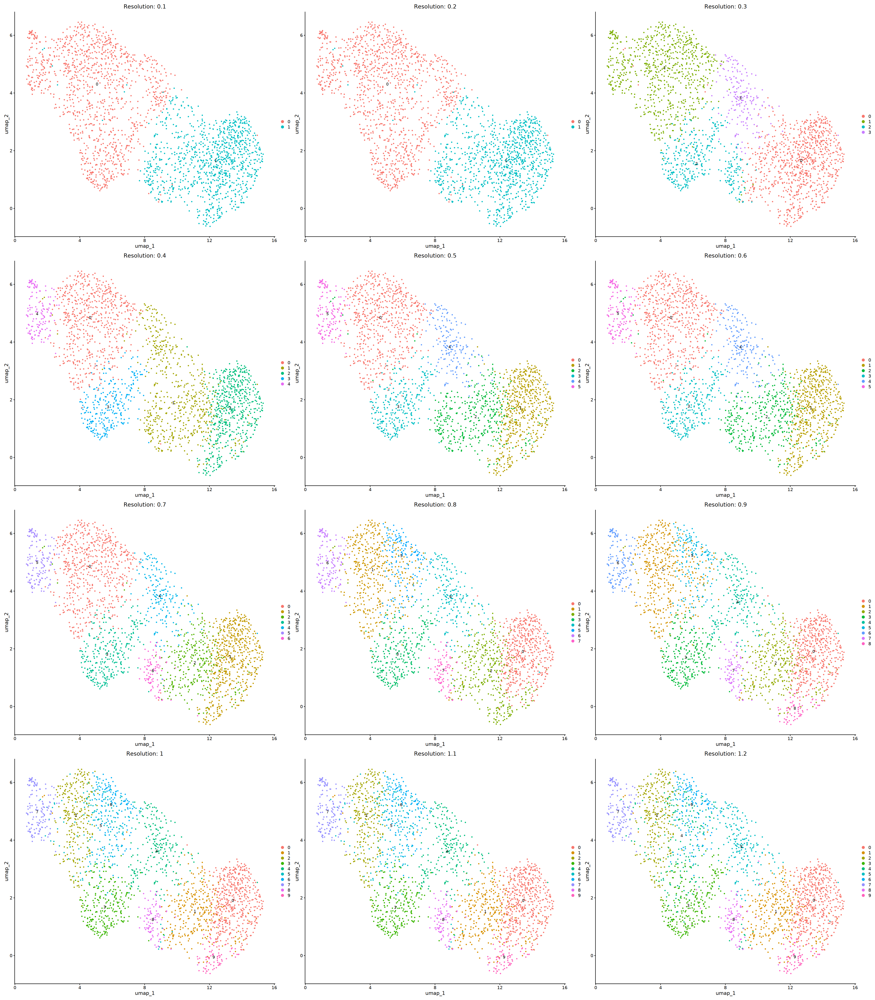

In [25]:
options(repr.plot.width = 35, repr.plot.height = 40)
wrap_plots(plot_list, ncol = 3)

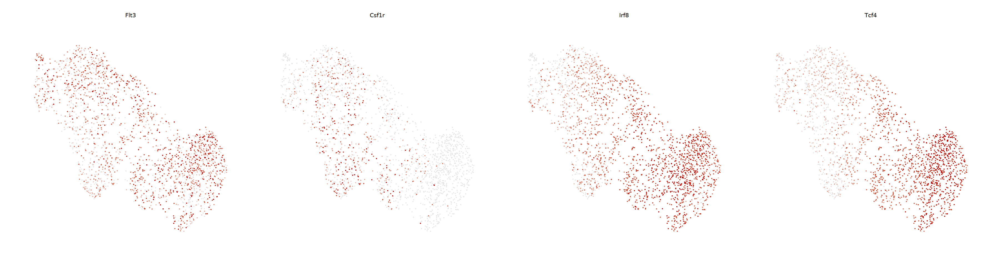

In [26]:
# 设置图形大小
options(repr.plot.width = 30, repr.plot.height = 8)

# 创建FeaturePlot
FeaturePlot(seu,
    features = c( "Flt3","Csf1r", "Irf8", "Tcf4"),
    ncol = 4,
    pt.size = 0.1,
    order = TRUE,
    reduction = "umap",
    cols = c("grey90", "#B30000"),
    min.cutoff = "q10",
    max.cutoff = "q90"
) &
theme_minimal() &
theme(
    plot.title = element_text(size = 12, face = "bold", hjust = 0.5),  # 标题居中
    strip.text = element_text(size = 12, face = "bold", hjust = 0.5),  # 分面标题居中
    axis.title = element_blank(),    # 移除轴标题
    axis.text = element_blank(),     # 移除轴文本
    axis.ticks = element_blank(),    # 移除轴刻度线
    legend.position = "none",        # 移除图例
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    plot.margin = margin(0.5, 0.5, 0.5, 0.5, "cm")
)

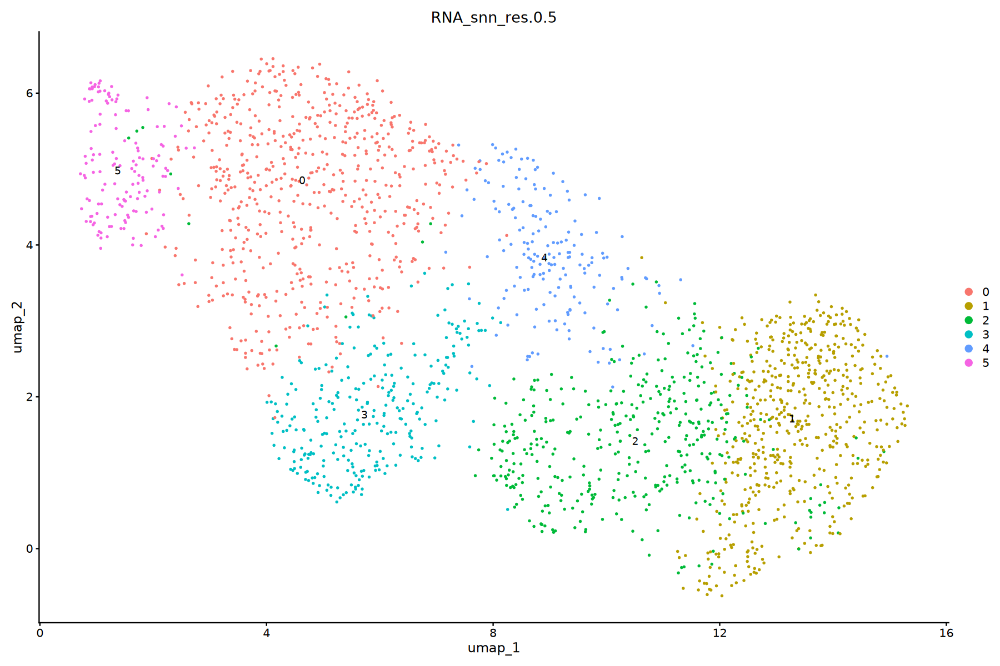

In [27]:
options(repr.plot.width = 15, repr.plot.height = 10)
DimPlot(seu,
        reduction = "umap",
        group.by = "RNA_snn_res.0.5",
        label = TRUE,
        label.size = 4,
        pt.size = 0.5)

基因 Sfpi1 未在数据集中找到。


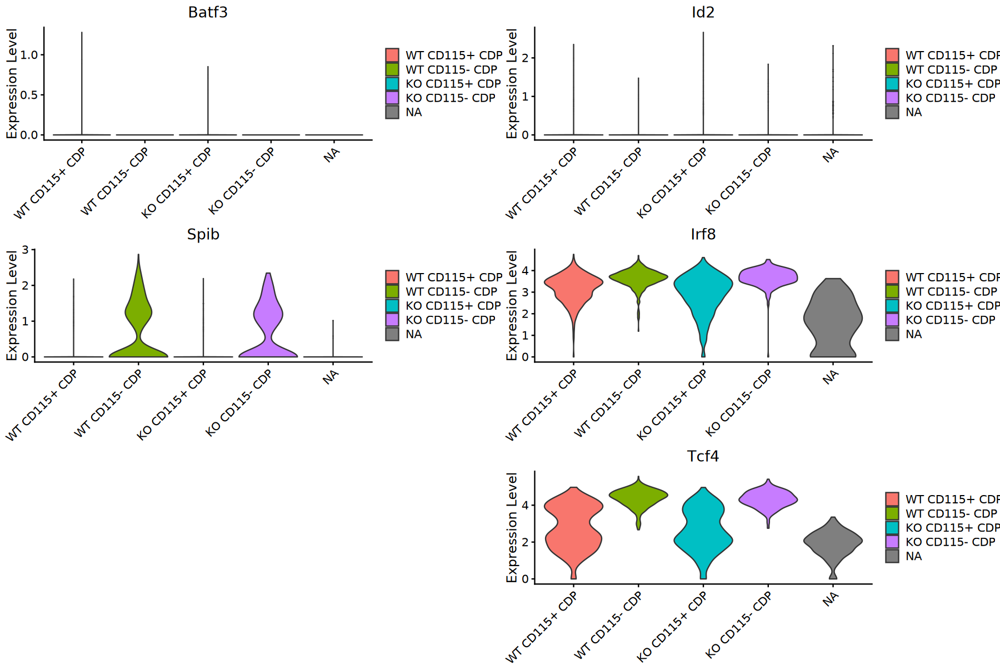

In [ ]:
cluster_mapping <- c(
  "0" = "CD115+ CDP",
    "2" = "CD115+ CDP",
      "3" = "CD115+ CDP",
        "4" = "CD115- CDP",
          "5" = "CD115 CDP",
  "1" = "CD115- CDP"
)
# 2. 设置聚类顺序和celltype
Idents(seu) <- seu$RNA_snn_res.0.5  
seu$celltype <- plyr::mapvalues(
  Idents(seu),
  from = names(cluster_mapping),
  to = unname(cluster_mapping)
)
# 创建一个新的分组变量，将orig.ident(WT/KO)和celltype(CD115+/CD115-)组合
seu$group <- paste(seu$orig.ident, seu$celltype, sep = " ")

# 设置小提琴图的显示顺序
group_levels <- c("WT CD115+ CDP", "WTearly CDP", "KO CD115+ CDP", "KO early CDP")
seu$group <- factor(seu$group, levels = group_levels)

# 创建小提琴图
library(ggplot2)
library(cowplot)

# 需要比较的基因列表(使用正确的小鼠基因符号)
genes_to_plot <- c("Batf3", "Id2", "Spib", "Irf8", "Sfpi1", "Tcf4")

# 创建一个空列表存储每个基因的小提琴图
plot_list <- list()

# 为每个基因创建小提琴图
for (i in seq_along(genes_to_plot)) {
  gene <- genes_to_plot[i]
  
  # 检查基因是否在数据集中
  if (gene %in% rownames(seu)) {
    p <- VlnPlot(seu, features = gene, group.by = "group", 
                 pt.size = 0, combine = FALSE)[[1]] +
      theme(axis.title.x = element_blank(),
            axis.text.x = element_text(angle = 45, hjust = 1),
            plot.title = element_text(hjust = 0.5)) +
      xlab("")
    
    plot_list[[i]] <- p
  } else {
    cat(paste0("基因 ", gene, " 未在数据集中找到。\n"))
  }
}

# 组合所有小提琴图并显示
combined_plot <- plot_grid(plotlist = plot_list, ncol = 2)
print(combined_plot)